.\Fig0533(a)(circle).tif
This is a gray image


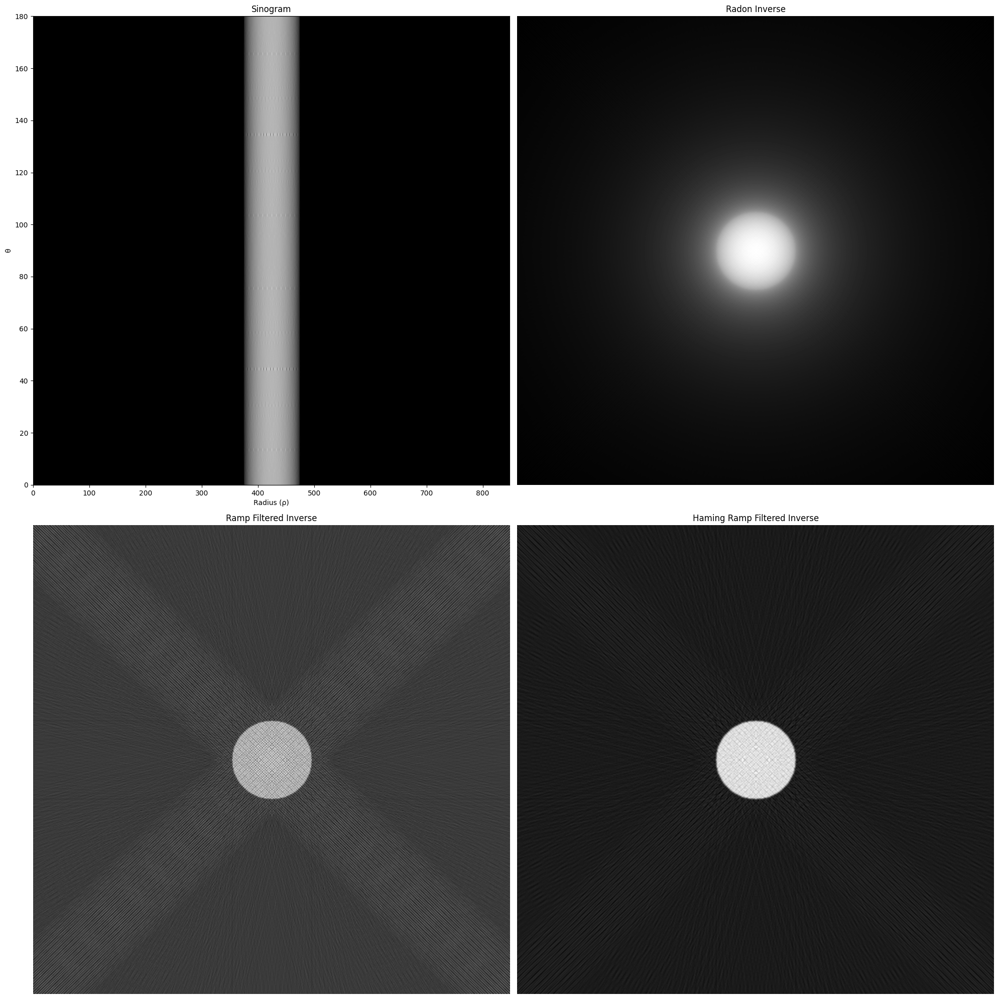

.\Fig0534(a)(ellipse_and_circle).tif
This is a gray image


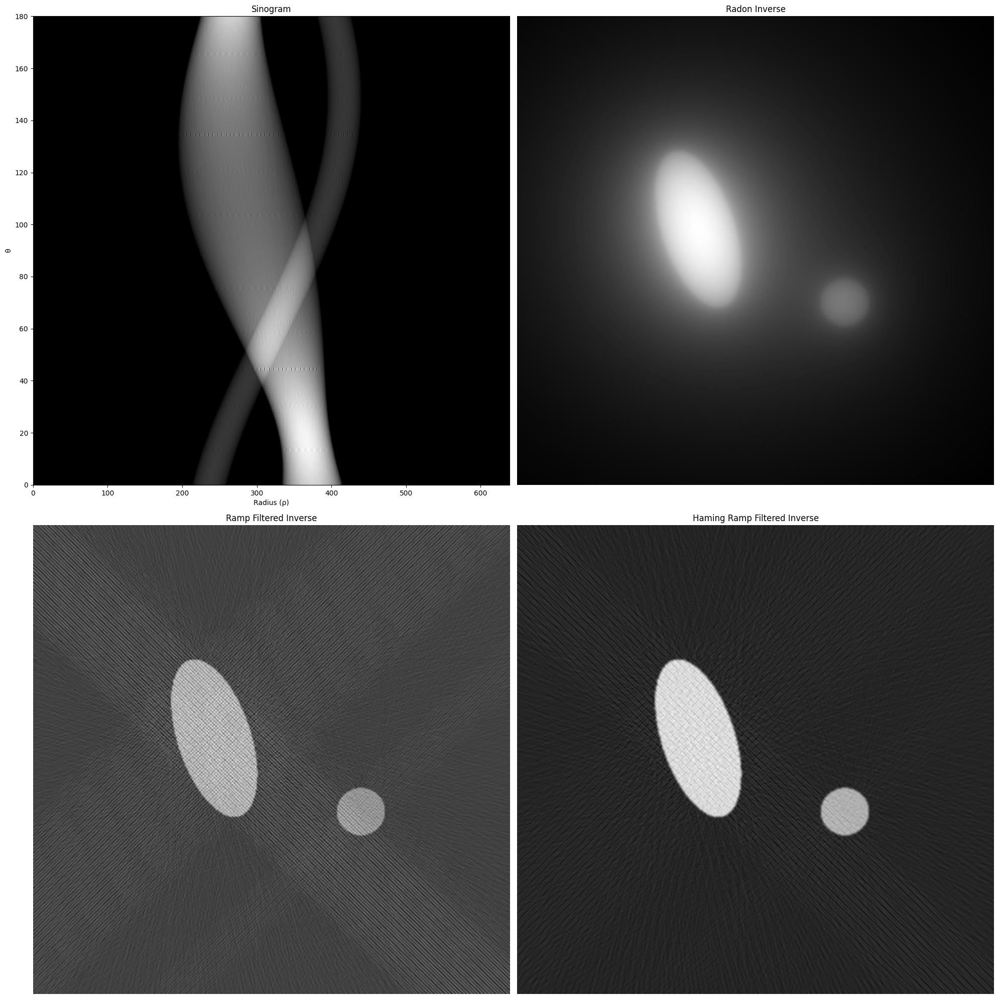

.\Fig0539(a)(vertical_rectangle).tif
This is a gray image


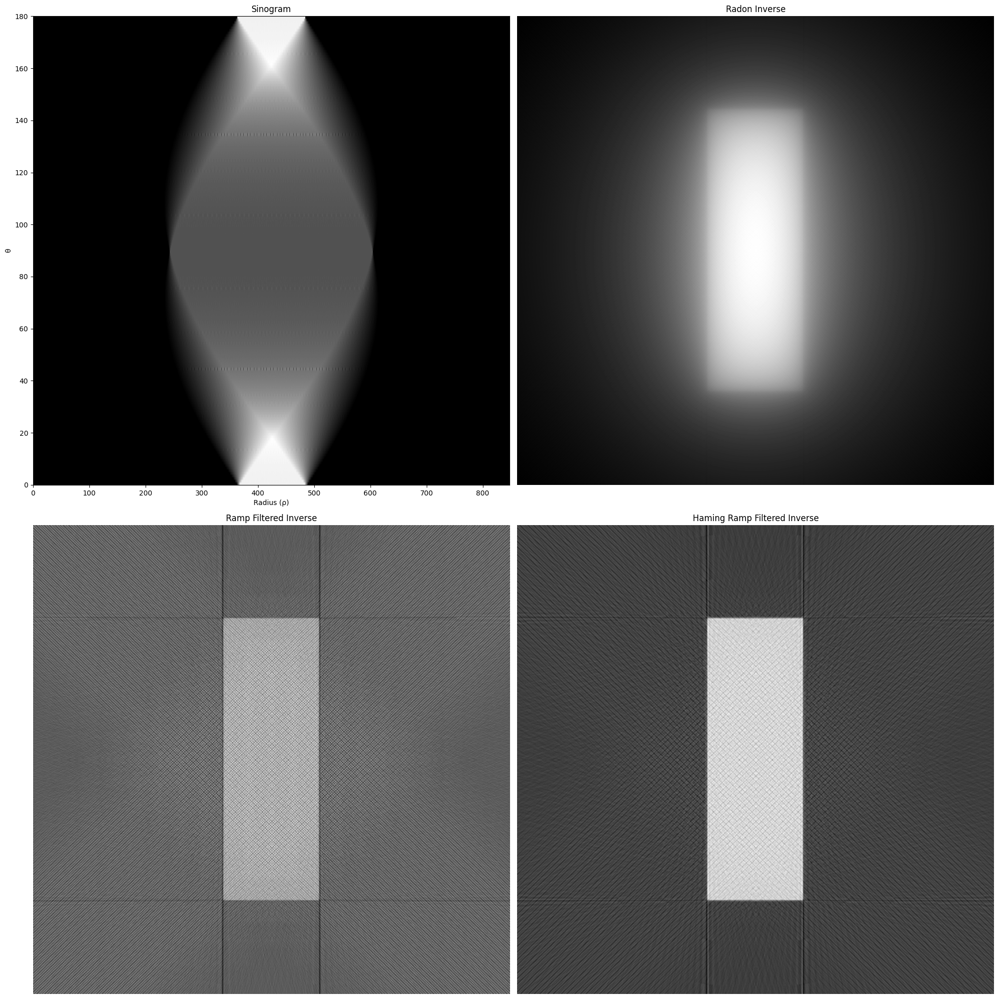

.\Fig0539(c)(shepp-logan_phantom).tif
This is a gray image


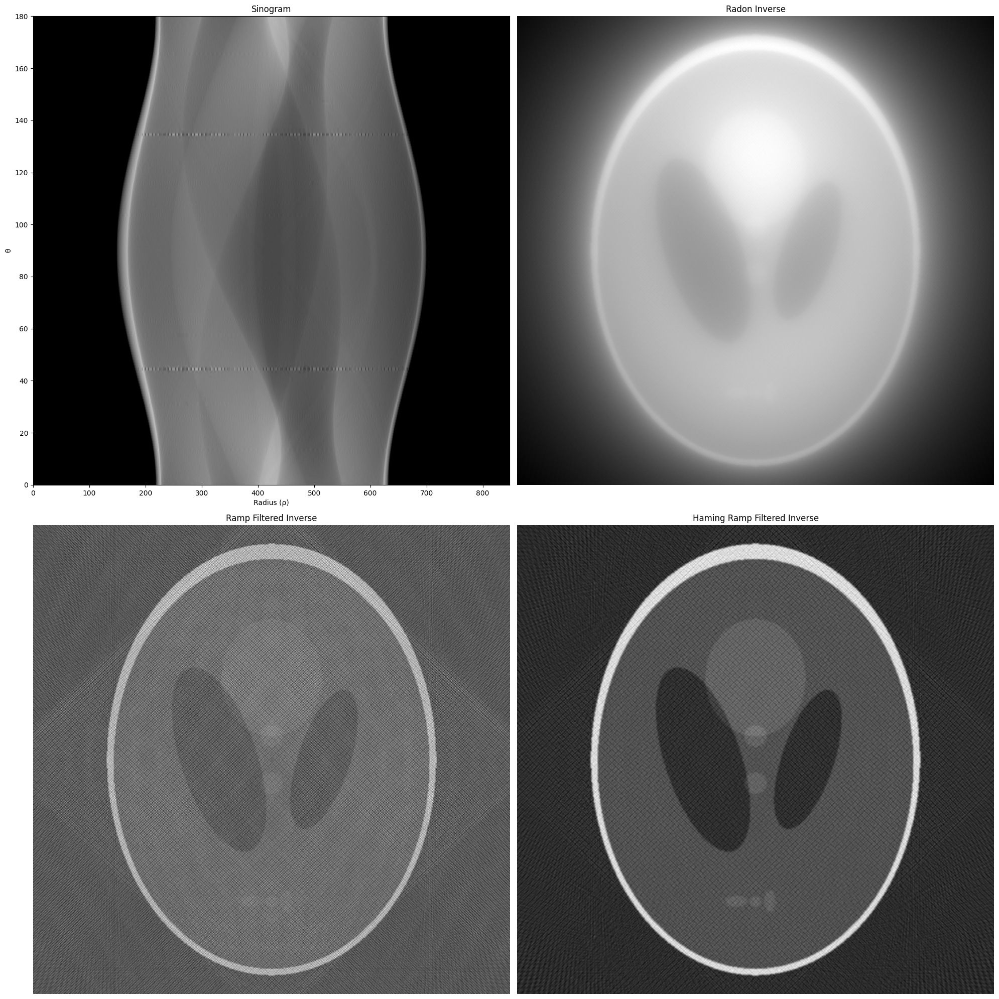

In [2]:
# 画图
import cv2
import os
import matplotlib.pyplot as plt
from myfunction import(
    find_files_recursive,
    transform,
    inverse_radon_transform,
    filter_transform,
    sinogram,
    sinogram_i

)
extensions = ['.tif']
filenames = find_files_recursive('.',extensions) #'.'表示当前目录
randons = []
for filename in filenames:
    print(filename)

    # 读取图像
    im = cv2.imread(filename, cv2.IMREAD_UNCHANGED)  # IMREAD_UNCHANGED 保持原始图像的深度
    # radnon_result = sinogram(im)
    # radon_inverse = sinogram_i(radnon_result,FBP=False)
    # radon_inverse_filtered = sinogram_i(radnon_result,FBP=True)
    radon_result = transform(im)
    radon_inverse = inverse_radon_transform(radon_result)
    filter_result_ramp = filter_transform(radon_result,0)
    filter_result_haming = filter_transform(radon_result,1)


      
    if len(im.shape) == 2:  # 灰度图  
        print("This is a gray image")  
    elif len(im.shape) == 3 and im.shape[2] == 1:  # 在某些情况下，OpenCV可能以(高度, 宽度, 1)的形式返回灰度图  
        print("This is a gray image")  
    elif len(im.shape) == 3 and im.shape[2] == 3:  # RGB图  
        print("This is an RGB image")  
    else:  
        print("这是其他类型的图像")
    
    # 创建 result 文件夹
    if not os.path.exists('result'):
        os.makedirs('result')


    # 创建子图
    plt.figure(figsize=(20, 20))  # 设置图形大小

    # 子图1：Radon变换结果
        # 子图2：Radon反变换结果
    # plt.subplot(2, 2, 1)  # 2行2列的第2个子图
    # plt.title('Original Image')
    # plt.imshow(im, cmap='gray', aspect='auto')
    # plt.axis('off')  # 不显示坐标轴

    # plt.subplot(2, 2, 2)  # 2行2列的第1个子图
    # plt.title('Radon Transform')
    # plt.imshow(radnon_result, cmap='gray', aspect='auto',
    #            extent=(0, radnon_result.shape[0], 0, 180))
    # plt.ylabel('θ')
    # plt.xlabel('Radius (ρ)')


    # # 子图3：窗口滤波后的结果
    # plt.subplot(2, 2, 3)  # 2行2列的第3个子图
    # plt.title('Radon Inverse')
    # plt.imshow(radon_inverse, cmap='gray',aspect='auto')  # 显示窗口滤波图像
    # plt.axis('off')  # 不显示坐标轴

    # # 子图4：Haming过滤后的结果
    # plt.subplot(2, 2, 4)  # 2行2列的第4个子图
    # plt.title('Haming Ramp Filtered')
    # plt.imshow(radon_inverse_filtered, cmap='gray',aspect='auto')  # 显示Haming滤波图像
    # plt.axis('off')  # 不显示坐标轴

    plt.subplot(2, 2, 1)  # 2行2列的第2个子图
    plt.title('Sinogram')
    plt.imshow(radon_result.T, cmap='gray', aspect='auto',extent=(0, radon_result.shape[0], 0, 180))
    plt.ylabel('θ')
    plt.xlabel('Radius (ρ)')

    plt.subplot(2, 2, 2)  # 2行2列的第1个子图
    plt.title('Radon Inverse')
    plt.imshow(radon_inverse, cmap='gray', aspect='auto',
               )
    plt.axis('off')  # 不显示坐标轴


    # 子图3：窗口滤波后的结果
    plt.subplot(2, 2, 3)  # 2行2列的第3个子图
    plt.title('Ramp Filtered Inverse')
    plt.imshow(filter_result_ramp, cmap='gray',aspect='auto')  # 显示窗口滤波图像
    plt.axis('off')  # 不显示坐标轴

    # 子图4：Haming过滤后的结果
    plt.subplot(2, 2, 4)  # 2行2列的第4个子图
    plt.title('Haming Ramp Filtered Inverse')
    plt.imshow(filter_result_haming, cmap='gray',aspect='auto')  # 显示Haming滤波图像
    plt.axis('off')  # 不显示坐标轴

    plt.tight_layout()  # 调整子图间距
    plt.savefig(f'result/{filename}_radon_transform.jpg')
    plt.show()




